In [1]:
using HDF5, Printf, NNlib, Statistics, Plots, JLD2, LinearAlgebra, Distributions

include("gillespie.jl")
include("PathwayElaboration.jl")
include("occupancyPlot.jl")

transationPlot (generic function with 3 methods)

In [2]:
cd("/Users/chenwei/Desktop/Github/RPE/code")
pwd()

"/Users/chenwei/Desktop/Github/RPE/code"

In [3]:
dataname = "synthetic50"

"synthetic50"

In [4]:
## Original data
data = load("data/original/$dataname.h5")
sep = hcat(split.(setdiff(keys(data),["states"]), "/")...)
# get dataset name
data_keys = Set(String.(sep[1, :]))
# get Si, Sf, energies, K
data_values = Set(String.(sep[2, :]))
# get coordinates
states = data["states"];

In [5]:
## Result CTMC
data_hat = load("data/results/$dataname.h5")
sep_hat = hcat(split.(setdiff(keys(data_hat)), "/")...)
# get dataset name (each dataset has different configuration, i.e. diff Si and Sf)
data_keys_hat = Set(String.(sep_hat[1, :]))
# get Khat, Shat, Si_hat, est_mfpt, obs_mfpt, Sf_hat
data_values_hat = Set(String.(sep_hat[2, :]));

In [6]:
# Exact CTMC arguments
Si = (data["side_basin2/Si"])
Si = Int(data["side_basin2/Si"][10])
Sf = data["side_basin2/Sf"]
Sf = Int(data["side_basin2/Sf"][10])
K = data["side_basin2/K"]
energy = data["side_basin2/energies"]

Si_hat = data_hat["side_basin2_10/Si_hat"]
Sf_hat = data_hat["side_basin2_10/Sf_hat"]
Shat = data_hat["side_basin2_10/Shat"]
Khat = data_hat["side_basin2_10/Khat"]
obs_mfpt = data_hat["side_basin2_10/obs_mfpt"]
est_mfpt = data_hat["side_basin2_10/est_mfpt"]
Si_hat, Sf_hat,size(Shat)


(1, 776, (1875,))

In [7]:
function getCoord(Shat,states,samples,Si_hat,Sf_hat)
    d = size(states)[2]
    l = length(Shat)    
    states_hat = zeros(l,d)
    for i=1:l
        states_hat[i,:] = states[Shat[i],:]
    end
    
    X=[];Y=[]
    for Trj in samples
        xx=[];yy=[]
        for trj in Trj
            x, y = states_hat[trj,:]
            append!(xx,x)
            append!(yy,y)
        end
        push!(X,xx)
        push!(Y,yy)
    end

    x_Si,y_Si=states_hat[Si_hat,:]
    x_Sf,y_Sf=states_hat[Sf_hat,:]

    return X,Y,x_Si,y_Si,x_Sf,y_Sf
end

getCoord (generic function with 1 method)

In [8]:
### gillespie samples on full matrix
N = 10 # number of samples
samples, t_per, t_total = gillespie(Si_hat, Khat, StoppingCondition(pred=AbsorbingStates([Sf_hat])), N);

In [9]:
Max_times=[]; Max_times_ids=[]
for i=1:N
    maxtime = findmax(t_per[i])[1]
    maxtimeid = samples[i][findmax(t_per[i])[2]]
    append!(Max_times,maxtime)
    append!(Max_times_ids,maxtimeid)
end
Max_times, Max_times_ids

(Any[4.902406555620306e-6, 1.5137091594735167e-6, 7.963803493241923e-7, 5.605832433265189e-6, 4.972737164693776e-6, 5.574347153057723e-6, 3.404756914611903e-6, 4.840489056754116e-6, 8.885848248562386e-7, 4.181761896461021e-6], Any[833, 813, 1848, 833, 833, 833, 813, 819, 799, 833])

In [10]:
trj_t1 = hcat(samples[1],t_per[1]);
# Sort states by the maxium time
sorted_trj_t1 = sortslices(trj_t1, dims=1, by=x->x[2],rev=true)
# Get the coordinates of sorted states
sort_array1 = [trunc.(Int,sorted_trj_t1[:,1])]
X_sr,Y_sr,x_Si,y_Si,x_Sf,y_Sf = getCoord(Shat,states,sort_array1,Si_hat,Sf_hat)
# Find the first sorted state whose time smaller than 5e-7
pos = findfirst(x->x<5e-7, sorted_trj_t1[:,2]);

In [11]:
(x_Si,y_Si), (x_Sf,y_Sf)

((49.0, 49.0), (0.0, 0.0))

In [18]:
plotlyjs()
plot()
# States over time
scatter!(X_sr[1][1:pos],Y_sr[1][1:pos],sorted_trj_t1[:,2][1:pos],color=cgrad(:cool)[0.1],markersize=3,legend=false)
scatter!(X_sr[1][pos+1:end],Y_sr[1][pos+1:end],sorted_trj_t1[:,2][pos+1:end],color=cgrad(:Blues)[0.1],markersize=2,legend=false)
# plot!([x_Si],[y_Si], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
#         series_annotations = [("I",:center,8)])
# plot!([x_Sf],[y_Sf], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
#         series_annotations = [("F",:center,8)], right_margin = 4Plots.mm, left_margin = 4Plots.mm)
xlims!(-.9,50.1); ylims!(-.9,50.1)

In [ ]:
gr()
plot()
# States over time
scatter!(X_sr[1][1:pos],Y_sr[1][1:pos],sorted_trj_t1[:,2][1:pos],color=cgrad(:cool)[0.1],markersize=5,legend=false)
scatter!(X_sr[1][pos+1:end],Y_sr[1][pos+1:end],sorted_trj_t1[:,2][pos+1:end],color=cgrad(:Blues)[0.1],markersize=3,legend=false)
plot!([x_Si],[y_Si], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
        series_annotations = [("I",:center,8)])
plot!([x_Sf],[y_Sf], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
        series_annotations = [("F",:center,8)], right_margin = 4Plots.mm, left_margin = 4Plots.mm)
xlims!(-.9,50.1); ylims!(-.9,50.1)

In [14]:
# Get coordinates for gif plotting
X,Y,x_Si,y_Si,x_Sf,y_Sf = getCoord(Shat,states,samples,Si_hat,Sf_hat);

In [ ]:
gr()
@gif for i in 1:length(X[1])
    plot(X[1][1:i],Y[1][1:i],t_per[1][1:i],legend=false)
    xlims!(-.9,50.1); ylims!(-.9,50.1);
    plot!([x_Si],[y_Si], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
    series_annotations = [("I",:center,8)])
    plot!([x_Sf],[y_Sf], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
    series_annotations = [("F",:center,8)], right_margin = 4Plots.mm, left_margin = 4Plots.mm)
end

┌ Info: Saved animation to 
│   fn = /Users/chenwei/Desktop/Github/RPE/code/tmp.gif
└ @ Plots /Users/chenwei/.julia/packages/Plots/zozYv/src/animation.jl:114


Plots.AnimatedGif("/Users/chenwei/Desktop/Github/RPE/code/tmp.gif")
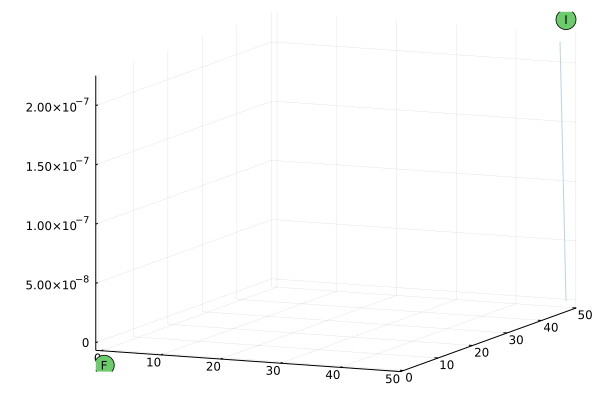

In [ ]:
gr()
plot()
@gif for i in 1:length(X[1])
    plot!([x_Si],[y_Si], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
        series_annotations = [("I",:center,8)])
    plot!([x_Sf],[y_Sf], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
        series_annotations = [("F",:center,8)], right_margin = 4Plots.mm, left_margin = 4Plots.mm)
    xlims!(-.9,50.1); ylims!(-.9,50.1);
    if i < length(X[1])
        if t_per[1][i] > 3e-7
            plot!(X[1][i:i+1],Y[1][i:i+1],t_per[1][i:i+1],color=cgrad(:cool)[0.5],linewidth=3,legend=false)
        else
            plot!(X[1][i:i+1],Y[1][i:i+1],t_per[1][i:i+1],color=cgrad(:Blues)[0.3],legend=false)
        end    
    end
end

┌ Info: Saved animation to 
│   fn = /Users/chenwei/Desktop/Github/RPE/code/tmp.gif
└ @ Plots /Users/chenwei/.julia/packages/Plots/zozYv/src/animation.jl:114


Plots.AnimatedGif("/Users/chenwei/Desktop/Github/RPE/code/tmp.gif")
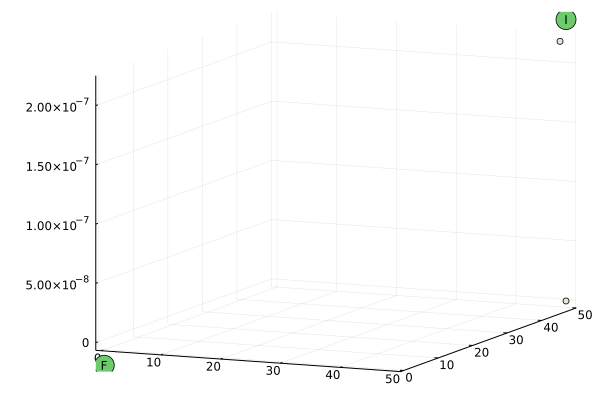

In [ ]:
gr()
plot()
# Trajactory (traverse states) over time
@gif for i in 1:length(X[1])
    plot!([x_Si],[y_Si], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
        series_annotations = [("I",:center,8)])
    plot!([x_Sf],[y_Sf], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
        series_annotations = [("F",:center,8)], right_margin = 4Plots.mm, left_margin = 4Plots.mm)
    xlims!(-.9,50.1); ylims!(-.9,50.1);
    if i < length(X[1])
        if t_per[1][i] > 5e-7
            scatter!(X[1][i:i+1],Y[1][i:i+1],t_per[1][i:i+1],color=cgrad(:rainbow)[0.9],
            markershape=:star4, markersize=8,legend=false)
        else
            scatter!(X[1][i:i+1],Y[1][i:i+1],t_per[1][i:i+1],color=cgrad(:BrBG_6)[0.5],
            legend=false)
        end    
    end
end

┌ Info: Saved animation to 
│   fn = /Users/chenwei/Desktop/Github/RPE/code/tmp.gif
└ @ Plots /Users/chenwei/.julia/packages/Plots/zozYv/src/animation.jl:114


Plots.AnimatedGif("/Users/chenwei/Desktop/Github/RPE/code/tmp.gif")
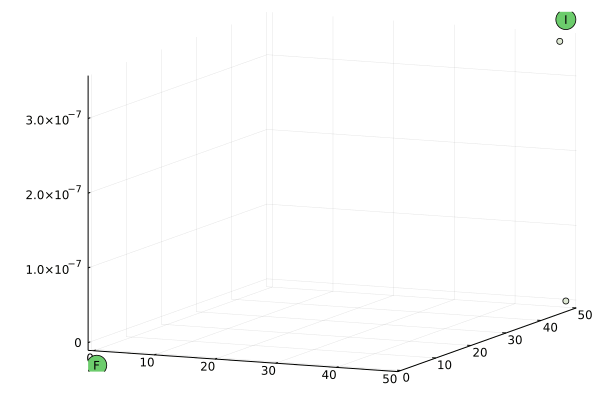

In [ ]:
gr()
plot()
# Trajactory (traverse states) over time
@gif for i in 1:length(X[1])
    plot!([x_Si],[y_Si], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
        series_annotations = [("I",:center,8)])
    plot!([x_Sf],[y_Sf], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
        series_annotations = [("F",:center,8)], right_margin = 4Plots.mm, left_margin = 4Plots.mm)
    xlims!(-.9,50.1); ylims!(-.9,50.1);
    if i < length(X[1])
        if t_per[1][i+1] > 5e-7
            scatter!(X[1][i:i+1],Y[1][i:i+1],t_per[1][i:i+1],color=cgrad(:rainbow)[0.9],
            markershape=:star5, markersize=8,legend=false)
        else
            scatter!(X[1][i:i+1],Y[1][i:i+1],t_per[1][i:i+1],color=cgrad(:BrBG_6)[0.5],
            legend=false)
        end    
    end
end

┌ Info: Saved animation to 
│   fn = /Users/chenwei/Desktop/Github/RPE/code/tmp.gif
└ @ Plots /Users/chenwei/.julia/packages/Plots/zozYv/src/animation.jl:114


Plots.AnimatedGif("/Users/chenwei/Desktop/Github/RPE/code/tmp.gif")
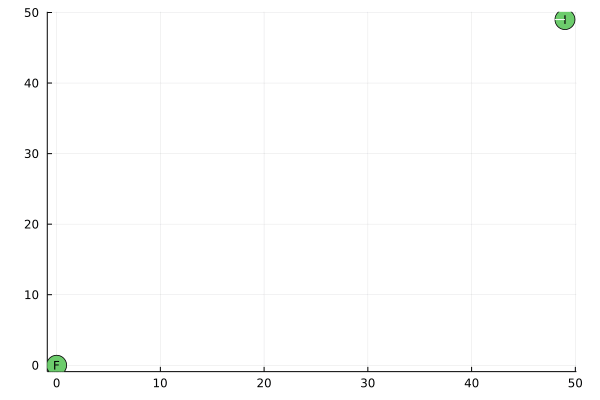

In [ ]:
plot()
@gif for i in 1:length(X[1])
    plot!([x_Si],[y_Si], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
        series_annotations = [("I",:center,8)])
    plot!([x_Sf],[y_Sf], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
        series_annotations = [("F",:center,8)], right_margin = 4Plots.mm, left_margin = 4Plots.mm)
    xlims!(-.9,50.1); ylims!(-.9,50.1);

    if i < length(X[1])
        plot!(X[1][i:i+1],Y[1][i:i+1],color=cgrad(:Purples)[0+i/length(X[1])],legend=false)
    end
end

┌ Info: Saved animation to 
│   fn = /Users/chenwei/Desktop/Github/RPE/code/tmp.gif
└ @ Plots /Users/chenwei/.julia/packages/Plots/zozYv/src/animation.jl:114


Plots.AnimatedGif("/Users/chenwei/Desktop/Github/RPE/code/tmp.gif")
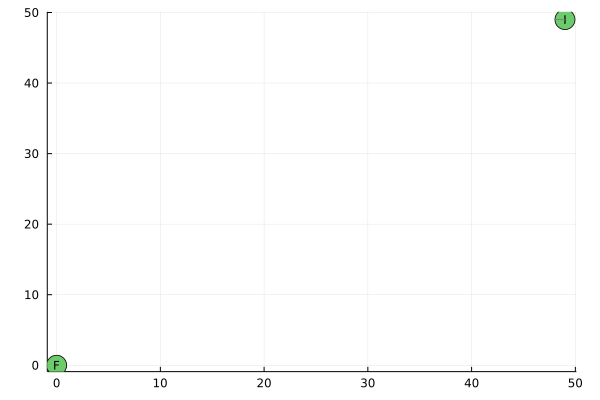

In [ ]:
plot()
@gif for i in 1:length(X[1])
    plot!([x_Si],[y_Si], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
        series_annotations = [("I",:center,8)])
    plot!([x_Sf],[y_Sf], seriestype = :scatter, markersize=12, color=cgrad(:greens)[.25],
        series_annotations = [("F",:center,8)], right_margin = 4Plots.mm, left_margin = 4Plots.mm)
    xlims!(-.9,50.1); ylims!(-.9,50.1);



    if i < length(X[1])
        if t_per[1][i] > 5e-7
            plot!(X[1][i:i+1],Y[1][i:i+1],color=:red,linewidth=5,legend=false)
        else
            plot!(X[1][i:i+1],Y[1][i:i+1],color=:grey,legend=false)
        end
    end
end

In [7]:
import numpy as np
import h5py


In [8]:
pca_coords=np.ones((10,2))

In [14]:
pca_coords[:,0]

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [10]:
# save embeddings and energy to h5 file
hf1 = h5py.File("../testpy.h5", "w")
g1 = hf1.create_group("TRJ1")
g1.create_dataset('X', data=pca_coords[:,0])
g1.create_dataset('Y', data=pca_coords[:,1])
hf1.close

<bound method File.close of <HDF5 file "testpy.h5" (mode r+)>>

In [27]:
hf1 = h5py.File("../testpy5.h5","w",libver=('earliest', 'v110'))
hf1.create_dataset('X', data=pca_coords[:,0])
# hf1.create_dataset('Y', data=pca_coords[:,1])
hf1.close

<bound method File.close of <HDF5 file "testpy5.h5" (mode r+)>>

In [28]:
A = pca_coords[:,0]
A

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [29]:
hf1 = h5py.File("../testpy3.h5","w",libver=('earliest', 'v110'))
hf1.create_dataset("A", A)
# hf1.create_dataset('Y', data=pca_coords[:,1])
hf1.close

<bound method File.close of <HDF5 file "testpy3.h5" (mode r+)>>